In [171]:
import pandas as pd 
import numpy as np 

from sklearn.preprocessing import StandardScaler 
from sklearn.linear_model  import Ridge,Lasso,RidgeCV, LassoCV, ElasticNet, ElasticNetCV, LogisticRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor 
from sklearn.metrics import accuracy_score, confusion_matrix, roc_curve, roc_auc_score, classification_report
from pandas_profiling import ProfileReport
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

import matplotlib.pyplot as plt
import seaborn as sns
import pickle
%matplotlib inline

In [2]:
df = pd.read_csv("https://raw.githubusercontent.com/plotly/datasets/master/diabetes.csv")
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [3]:
df.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [5]:
df.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [6]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

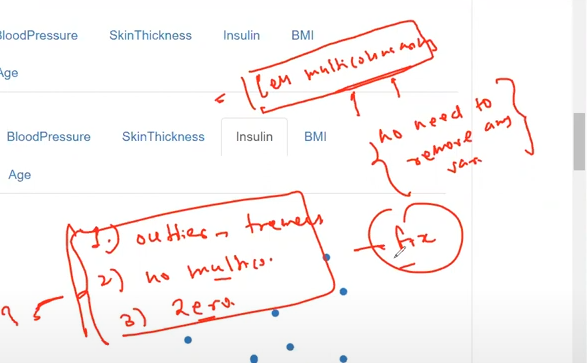

In [7]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [8]:
count=(df['BloodPressure']==0).sum()   # output booleans and then sum
count

35

In [9]:
df['BloodPressure']= df['BloodPressure'].replace(0,df['BloodPressure'].mean())   # set the mean value as replacement 

In [10]:
count=(df['BloodPressure']==0).sum()   # output booleans and then sum
count

0

In [11]:
zero_columns =["Insulin","Glucose","SkinThickness"]
for column in zero_columns:
    count=(df[column]==0).sum()   # output booleans and then sum
    print(f" {column} with {count} zeros")

 Insulin with 374 zeros
 Glucose with 5 zeros
 SkinThickness with 227 zeros


In [12]:
for column in zero_columns:
    df[column]= df[column].replace(0,df[column].mean())   # set the mean value as replacement 
    count=(df[column]==0).sum()   # output booleans and then sum
    print(f" {column} with {count} zeros")

 Insulin with 0 zeros
 Glucose with 0 zeros
 SkinThickness with 0 zeros


* logistic regression is sensitive to outliers so outliers should be taken care of

# outliers

<AxesSubplot:>

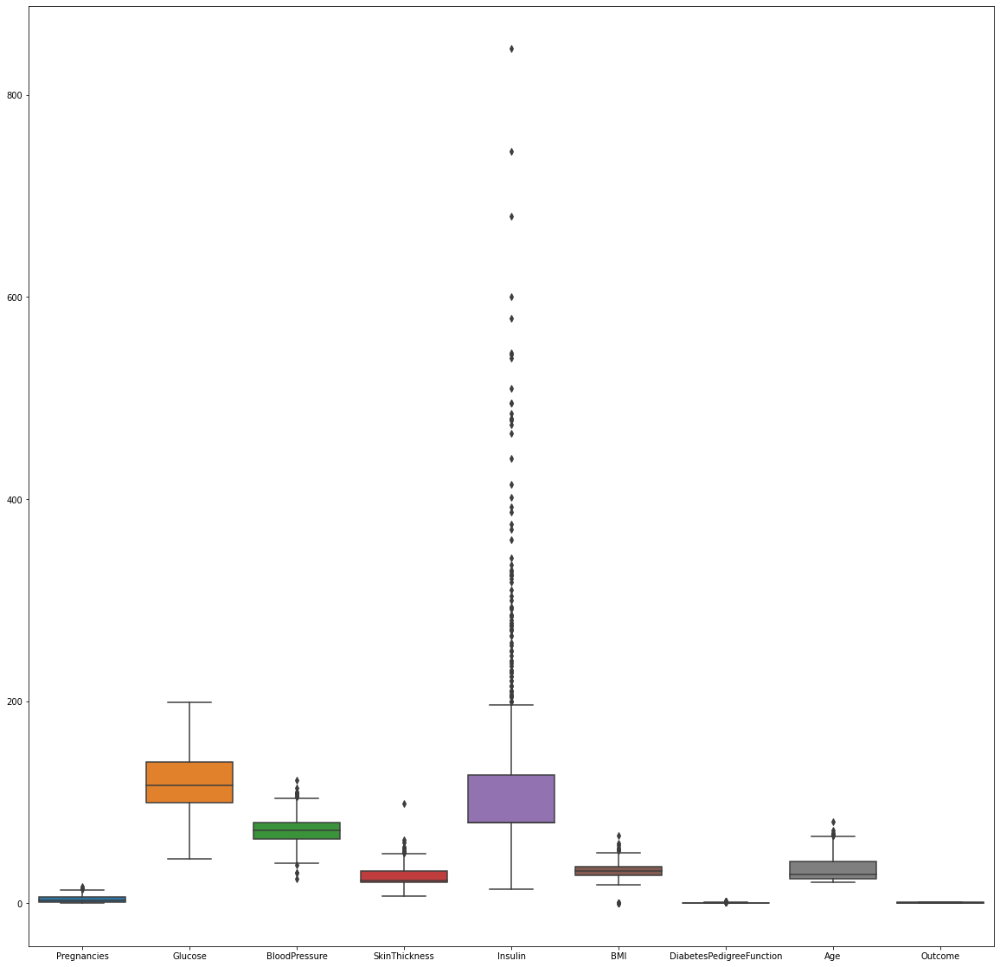

In [13]:
fig, ax = plt.subplots(figsize=(20,20))
sns.boxplot(data=df, ax=ax)

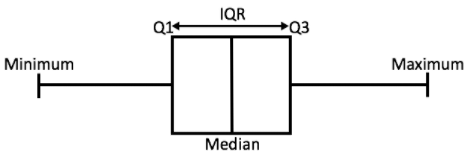
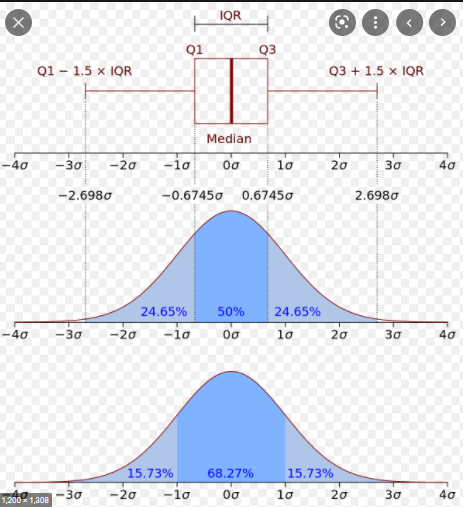

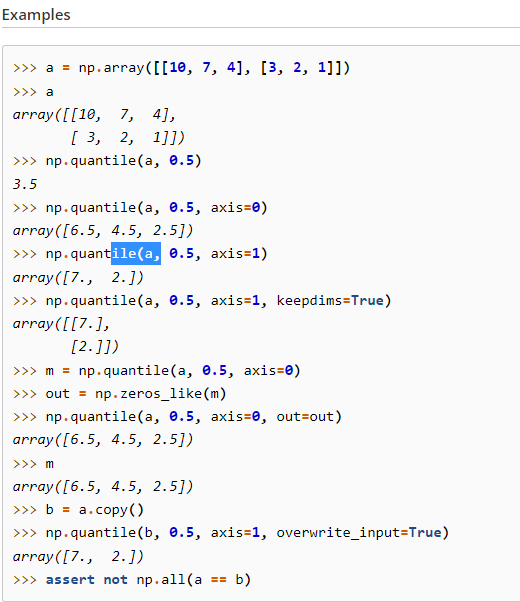

In [14]:
q70 = df["Insulin"].quantile(0.7)
q70

106.0

In [15]:
df[df["Insulin"]<q70]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
761,9,170.0,74.0,31.000000,79.799479,44.0,0.403,43,1
762,9,89.0,62.0,20.536458,79.799479,22.5,0.142,33,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


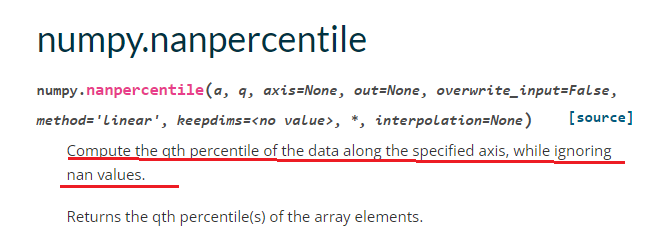

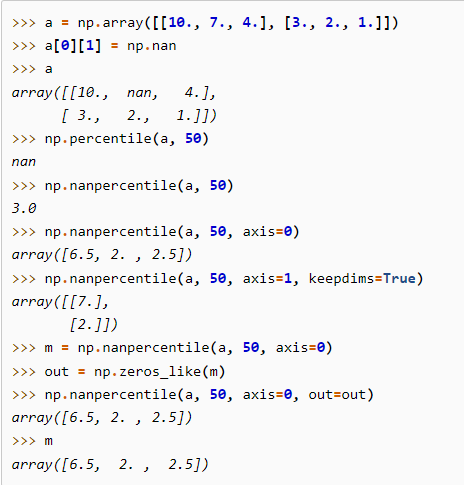

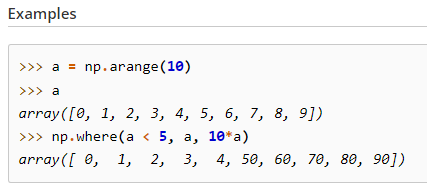

In [16]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [50]:
def outlier_limits(col):
    Q3, Q1 = np.nanpercentile(col, [75,25])
    IQR= Q3-Q1
    UL= Q3+1.5*IQR # "Maximum non-outlier value": 75th percentile + 1.5 * IQR
    LL= Q1-1.5*IQR # "Minimum non-outlier value": 25th percentile - 1.5 * IQR
    print(f" {col.name:^25}:'\t' Q3_75:{Q3:7.3f}'\t'  Q1_25:{Q1:7.3f}'\t' UL:{UL:7.3f}'\t' LL:{LL:7.3f}")
    return UL, LL

In [51]:
df.dtypes

Pregnancies                   int64
Glucose                     float64
BloodPressure               float64
SkinThickness               float64
Insulin                     float64
BMI                         float64
DiabetesPedigreeFunction    float64
Age                           int64
Outcome                       int64
dtype: object

In [52]:
data = df.copy()

for column in data.columns:
    if data[column].dtype != 'int64':
        UL, LL= outlier_limits(data[column])
        data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])  
data

          Glucose         :'	' Q3_75:140.250'	'  Q1_25: 99.750'	' UL:201.000'	' LL: 39.000
       BloodPressure      :'	' Q3_75: 80.000'	'  Q1_25: 64.000'	' UL:104.000'	' LL: 40.000
       SkinThickness      :'	' Q3_75: 32.000'	'  Q1_25: 20.536'	' UL: 49.195'	' LL:  3.341
          Insulin         :'	' Q3_75:127.250'	'  Q1_25: 79.799'	' UL:198.426'	' LL:  8.624
            BMI           :'	' Q3_75: 36.600'	'  Q1_25: 27.300'	' UL: 50.550'	' LL: 13.350
 DiabetesPedigreeFunction :'	' Q3_75:  0.626'	'  Q1_25:  0.244'	' UL:  1.200'	' LL: -0.330


,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,NaN,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


(0.0, 200.0)

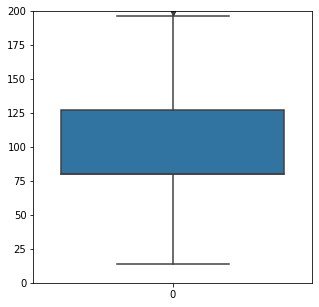

In [105]:
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(5,5))
sns.boxplot(data=df.Insulin, ax=ax)
plt.ylim(0, 200)

<AxesSubplot:>

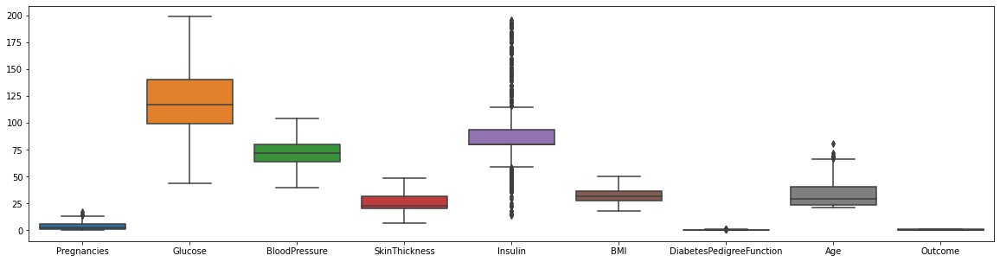

In [103]:
fig, ax = plt.subplots(figsize=(20,5))
sns.boxplot(data=data, ax=ax)

In [50]:
# def outlier_removal(self,data):
#         def outlier_limits(col):
#             Q3, Q1 = np.nanpercentile(col, [75,25])
#             IQR= Q3-Q1
#             UL= Q3+1.5*IQR
#             LL= Q1-1.5*IQR
#             return UL, LL

#         for column in data.columns:
#             if data[column].dtype != 'int64':
#                 UL, LL= outlier_limits(data[column])
#                 data[column]= np.where((data[column] > UL) | (data[column] < LL), np.nan, data[column])  

#         return data

In [56]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
4,0,137.0,40.0,35.000000,168.000000,43.1,NaN,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


In [60]:
data.isna().sum()

Pregnancies                  0
Glucose                      0
BloodPressure               14
SkinThickness               12
Insulin                     89
BMI                         19
DiabetesPedigreeFunction    29
Age                          0
Outcome                      0
dtype: int64

In [67]:
data.dropna(inplace=True)

In [68]:
data.isna().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

In [69]:
data

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50,1
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31,0
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32,1
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21,0
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.000000,180.000000,32.9,0.171,63,0
764,2,122.0,70.0,27.000000,79.799479,36.8,0.340,27,0
765,5,121.0,72.0,23.000000,112.000000,26.2,0.245,30,0
766,1,126.0,60.0,20.536458,79.799479,30.1,0.349,47,1


# Scaling

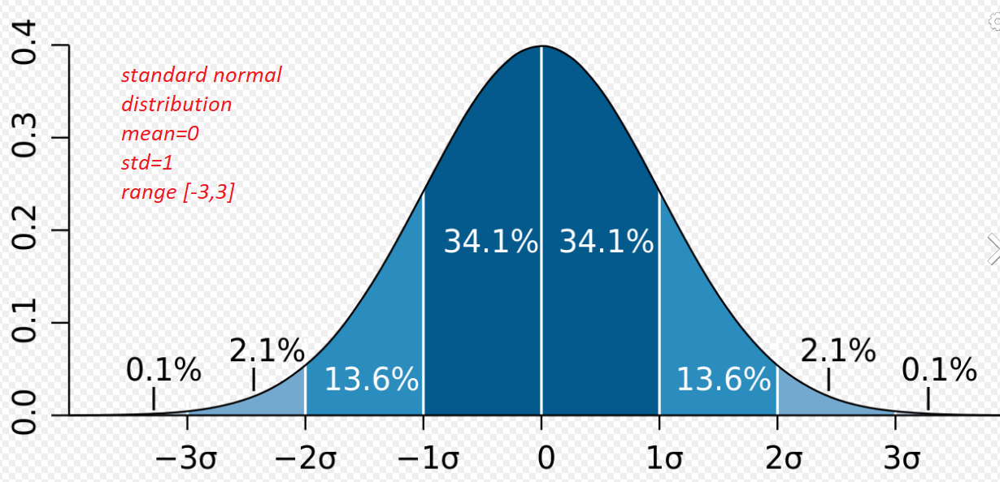

In [70]:
y = data['Outcome']
y

0      1
1      0
2      1
3      0
5      0
      ..
763    0
764    0
765    0
766    1
767    0
Name: Outcome, Length: 622, dtype: int64

In [71]:
X = data.drop(columns=['Outcome'])
X.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age
0,6,148.0,72.0,35.000000,79.799479,33.6,0.627,50
1,1,85.0,66.0,29.000000,79.799479,26.6,0.351,31
2,8,183.0,64.0,20.536458,79.799479,23.3,0.672,32
3,1,89.0,66.0,23.000000,94.000000,28.1,0.167,21
5,5,116.0,74.0,20.536458,79.799479,25.6,0.201,30


In [72]:
scalar = StandardScaler()
ProfileReport(pd.DataFrame(scalar.fit_transform(X)))
X_scaled = scalar.fit_transform(X)

In [73]:
data_scalar = pd.DataFrame(scalar.fit_transform(data))
print(data.shape, data_scalar.shape)


(622, 9) (622, 9)


<AxesSubplot:>

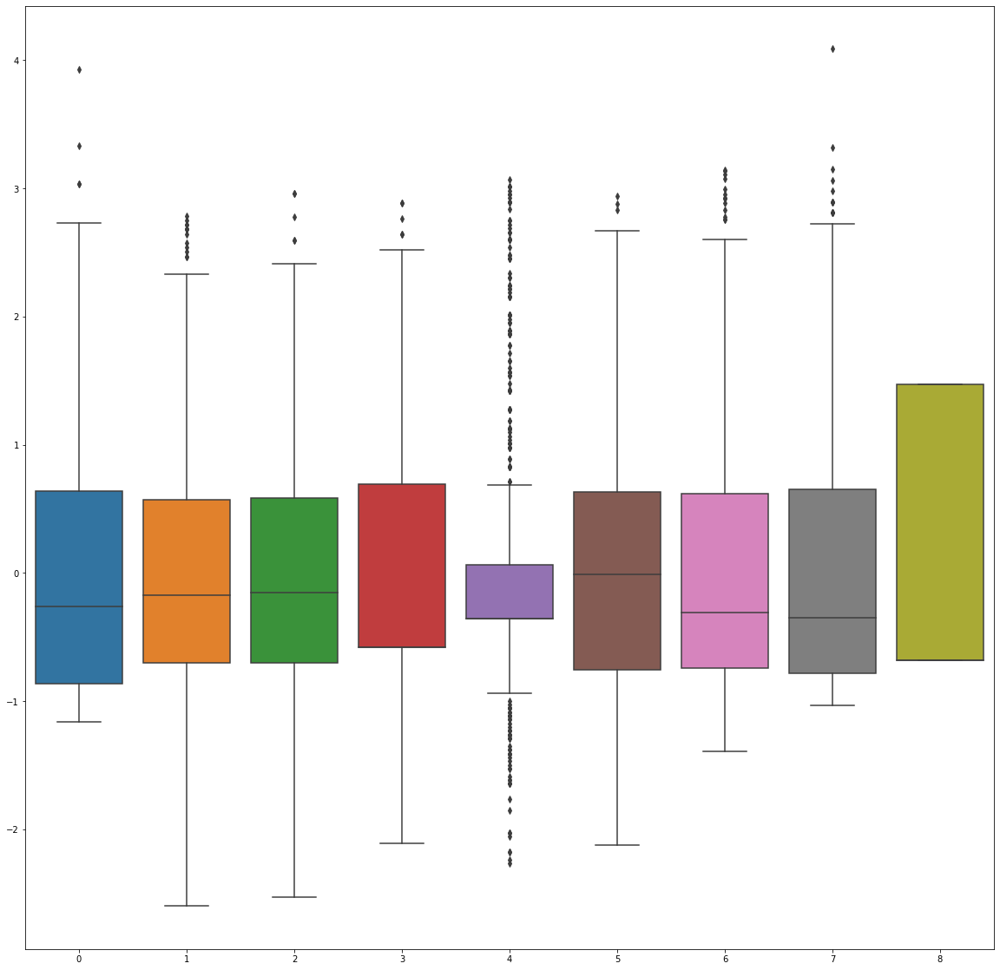

In [74]:
fig ,ax  = plt.subplots(figsize = (20,20))
sns.boxplot(data = data_scalar , ax = ax)

# multicolinearity

In [75]:
X.shape

(622, 8)

In [76]:
def vif_score(x):
    scaler = StandardScaler()
    arr = scaler.fit_transform(x)
    return pd.DataFrame([[x.columns[i], variance_inflation_factor(arr,i)] for i in range(arr.shape[1])], columns=["FEATURE", "VIF_SCORE"])


In [77]:
vif_score(X)  # no multi collinearity since vif_score values are lower than 5

,FEATURE,VIF_SCORE
0,Pregnancies,1.401364
1,Glucose,1.235995
2,BloodPressure,1.247402
3,SkinThickness,1.410079
4,Insulin,1.184975
5,BMI,1.453130
6,DiabetesPedigreeFunction,1.036051
7,Age,1.575869


# data splitting

In [79]:
x_train, x_test, y_train, y_test = train_test_split(X_scaled , y , test_size = .20 , random_state = 144)
print(X_scaled.shape, y.shape, x_train.shape, x_test.shape, y_train.shape, y_test.shape)

(622, 8) (622,) (497, 8) (125, 8) (497,) (125,)


In [80]:
x_test[0]

array([-0.86224667, -0.87547723, -1.43258792, -1.74270156, -0.35481727,
       -1.43964788, -0.01087764, -0.95137384])

In [81]:
x_train

array([[ 0.93546538, -0.5586443 ,  0.21485511, ...,  0.90161396,
        -0.87955423,  1.01430412],
       [ 0.03660936, -0.73466259, -1.06648947, ..., -0.53181166,
         0.095158  , -0.95137384],
       [-0.562628  ,  0.39185449,  1.13010124, ..., -0.56366556,
        -0.55329072, -0.52405255],
       ...,
       [ 0.93546538, -0.41782966, -1.06648947, ..., -0.80256983,
        -0.50435119, -0.35312403],
       [-0.26300932, -1.19231015, -0.33429257, ...,  0.05748554,
         0.6987455 , -0.69498107],
       [-1.16186535,  0.07502156,  0.21485511, ..., -0.16549178,
        -0.54921243, -0.60951681]])

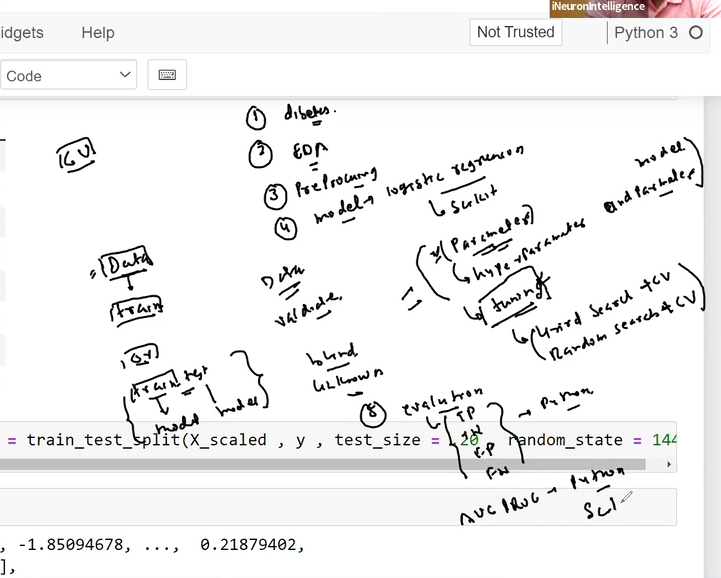

In [87]:
# Logistic regression used for binary classification or multiclass classification
# hyper parameters:  C (inverse of regularization strength, must be positive float, 
# smaller vales specify stronger regularization), penalty(l2-ridge,l1-lasso,elasticnet l1&l2) , solver
# (lbfgs, liblinear, sag, saga, newton-cg), max_iter

logr=LogisticRegression(verbose=1)
logr.fit(x_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(verbose=1)

In [90]:
x_test[0]

array([-0.86224667, -0.87547723, -1.43258792, -1.74270156, -0.35481727,
       -1.43964788, -0.01087764, -0.95137384])

In [92]:
logr.predict_proba([x_test[0]])   # prob of yes or not

array([[0.9638731, 0.0361269]])

In [109]:
y_test[:1]  # first element from the series

585    0
Name: Outcome, dtype: int64

In [94]:
logr.predict([x_test[0]])

array([0], dtype=int64)

In [111]:
# bulk prediction
ypred_logr = logr.predict(x_test)  # predicted values
ypred_logr

array([0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], dtype=int64)

In [112]:
np.array(y_test)  # real values

array([0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0,
       1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0], dtype=int64)

In [120]:
cm = confusion_matrix(y_test,ypred_logr)
cm

array([[77,  5],
       [24, 19]], dtype=int64)

In [116]:
tn,fp,fn,tp=confusion_matrix(y_test,ypred_logr).ravel()
print(f" tn:{tn}, fp:{fp}, fn:{fn}, tp:{tp}")

 tn:77, fp:5, fn:24, tp:19


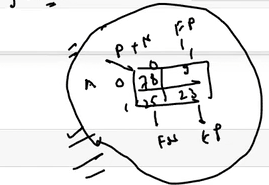

In [121]:
tn = cm[0][0]
tp = cm[1][1]
fp = cm[0][1]
fn = cm[1][0]
print(f" tn:{tn}, fp:{fp}, fn:{fn}, tp:{tp}")

 tn:77, fp:5, fn:24, tp:19


In [124]:
# accuracy
accuracy = (tp+tn)/(tp+fp+tn+fn)
print(f"Accuracy: {accuracy}")

# precission
precission = tp / (tp+fp)
print(f"Precission: {precission}")   # tp / predicted

# recall = sensitivity = TPR(along the actual)
recall = tp / (tp+fn)    # tp / actual
print(f"Recall: {recall}")  

# f1 score
f1_score = 2*(recall*precission)/(recall+precission)
print(f"F1 Score: {f1_score}")  

# Area under the curve
auc = roc_auc_score(y_test, ypred_logr)
print(f"AUC: {auc}")  

Accuracy: 0.768
Precission: 0.7916666666666666
Recall: 0.4418604651162791
F1 Score: 0.5671641791044777
AUC: 0.6904424276800907


In [131]:
print(f"Accuracy: {accuracy_score(y_test,ypred_logr)}")
print(classification_report(y_test,ypred_logr))

Accuracy: 0.768
              precision    recall  f1-score   support

           0       0.76      0.94      0.84        82
           1       0.79      0.44      0.57        43

    accuracy                           0.77       125
   macro avg       0.78      0.69      0.70       125
weighted avg       0.77      0.77      0.75       125



In [142]:
# predict probabilities
logr_probs = logr.predict_proba(x_test)
logr_probs

array([[0.9638731 , 0.0361269 ],
       [0.97701778, 0.02298222],
       [0.2947778 , 0.7052222 ],
       [0.31184063, 0.68815937],
       [0.95862889, 0.04137111],
       [0.75881994, 0.24118006],
       [0.52348237, 0.47651763],
       [0.82528332, 0.17471668],
       [0.96510934, 0.03489066],
       [0.52220574, 0.47779426],
       [0.90582401, 0.09417599],
       [0.49723737, 0.50276263],
       [0.25248508, 0.74751492],
       [0.91684227, 0.08315773],
       [0.88909133, 0.11090867],
       [0.90729146, 0.09270854],
       [0.89176936, 0.10823064],
       [0.23572537, 0.76427463],
       [0.95030295, 0.04969705],
       [0.80993285, 0.19006715],
       [0.8320437 , 0.1679563 ],
       [0.88963008, 0.11036992],
       [0.73446801, 0.26553199],
       [0.92145549, 0.07854451],
       [0.66059426, 0.33940574],
       [0.62780456, 0.37219544],
       [0.60917745, 0.39082255],
       [0.98134016, 0.01865984],
       [0.66921559, 0.33078441],
       [0.09554116, 0.90445884],
       [0.

In [144]:
logr_probs[:,0]

array([0.9638731 , 0.97701778, 0.2947778 , 0.31184063, 0.95862889,
       0.75881994, 0.52348237, 0.82528332, 0.96510934, 0.52220574,
       0.90582401, 0.49723737, 0.25248508, 0.91684227, 0.88909133,
       0.90729146, 0.89176936, 0.23572537, 0.95030295, 0.80993285,
       0.8320437 , 0.88963008, 0.73446801, 0.92145549, 0.66059426,
       0.62780456, 0.60917745, 0.98134016, 0.66921559, 0.09554116,
       0.93171904, 0.5369034 , 0.65435457, 0.87925794, 0.13663121,
       0.77224273, 0.65449664, 0.22045656, 0.7586053 , 0.25107211,
       0.87475993, 0.95605995, 0.93741969, 0.71468256, 0.93485366,
       0.94079927, 0.81092364, 0.87746912, 0.98620107, 0.97116856,
       0.67986939, 0.66327028, 0.91830394, 0.90778401, 0.64253915,
       0.93431726, 0.5775434 , 0.82858014, 0.75131951, 0.75612041,
       0.7041673 , 0.96866459, 0.96703399, 0.82853301, 0.88174323,
       0.94510566, 0.0361476 , 0.20362466, 0.89264664, 0.82301088,
       0.96040998, 0.30148947, 0.40182349, 0.57584953, 0.87434

In [145]:
fpr, tpr, thresholds = roc_curve(y_test, logr_probs[:,1])  # Probabilities for the positive outcome only
print(f"fpr:{fpr}\ntpr:{tpr}\nthresholds:{thresholds}")

fpr:[0.         0.         0.         0.01219512 0.01219512 0.02439024
 0.02439024 0.03658537 0.03658537 0.04878049 0.04878049 0.08536585
 0.08536585 0.09756098 0.09756098 0.14634146 0.14634146 0.17073171
 0.17073171 0.18292683 0.18292683 0.2804878  0.2804878  0.34146341
 0.34146341 0.36585366 0.36585366 0.40243902 0.40243902 0.41463415
 0.41463415 0.51219512 0.51219512 0.73170732 0.73170732 1.        ]
tpr:[0.         0.02325581 0.25581395 0.25581395 0.30232558 0.30232558
 0.37209302 0.37209302 0.41860465 0.41860465 0.44186047 0.44186047
 0.53488372 0.53488372 0.55813953 0.55813953 0.60465116 0.60465116
 0.65116279 0.65116279 0.74418605 0.74418605 0.79069767 0.79069767
 0.81395349 0.81395349 0.88372093 0.88372093 0.90697674 0.90697674
 0.95348837 0.95348837 0.97674419 0.97674419 1.         1.        ]
thresholds:[1.96925573 0.96925573 0.76427463 0.76391565 0.74751492 0.7052222
 0.68558189 0.67670816 0.61368215 0.59817651 0.58443607 0.47779426
 0.42415047 0.4224566  0.39450647 0.355596

# DISPLAY

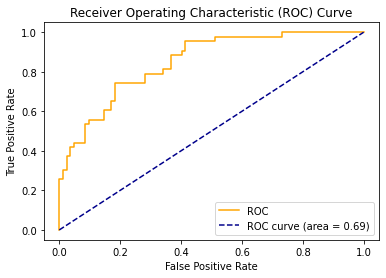

In [146]:
plt.plot(fpr, tpr, color='orange', label='ROC')
plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--',label='ROC curve (area = %0.2f)' % auc)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()
plt.show()

# Hyperparameter tunning

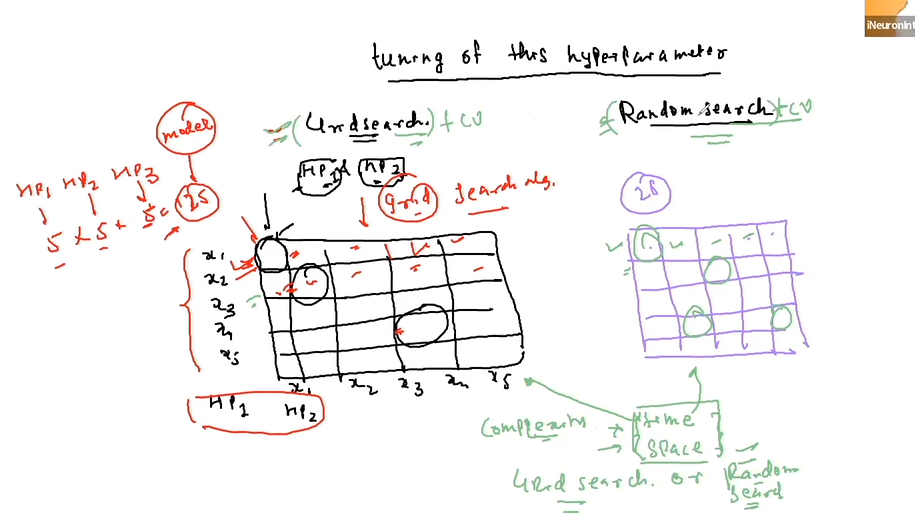

In [147]:
logr.get_params().keys()  # get the parameter keys for the logistic regression

dict_keys(['C', 'class_weight', 'dual', 'fit_intercept', 'intercept_scaling', 'l1_ratio', 'max_iter', 'multi_class', 'n_jobs', 'penalty', 'random_state', 'solver', 'tol', 'verbose', 'warm_start'])

In [149]:
param_grid = {"penalty":["l1","l2","elasticnet"],
              "C":np.logspace(-4,4,20),
              "solver":["liblinear","lbfgs","sag","saga"]}
param_grid

{'penalty': ['l1', 'l2', 'elasticnet'],
 'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
        4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
        2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
        1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
        5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
 'solver': ['liblinear', 'lbfgs', 'sag', 'saga']}

In [164]:
logr_gscv=GridSearchCV(logr,param_grid,cv=5, n_jobs=-1, verbose=1) # run the grid search

In [161]:
list(x_train)

[array([ 0.93546538, -0.5586443 ,  0.21485511,  1.78827923,  0.38830865,
         0.90161396, -0.87955423,  1.01430412]),
 array([ 0.03660936, -0.73466259, -1.06648947, -0.28160606, -0.35481727,
        -0.53181166,  0.095158  , -0.95137384]),
 array([-0.562628  ,  0.39185449,  1.13010124, -0.58156186, -0.35481727,
        -0.56366556, -0.55329072, -0.52405255]),
 array([-0.86224667, -0.62905161,  0.03180588, -1.6209436 , -0.64378934,
        -0.99369324,  0.97199119, -0.43858829]),
 array([ 1.23508406, -0.382626  ,  0.76400279, -0.58156186, -0.35481727,
        -1.1051819 ,  1.77949337,  0.07419727]),
 array([ 0.93546538,  2.71529598, -0.15124334,  0.93597352,  1.56784921,
        -1.02554715, -1.04676428,  1.86894671]),
 array([-0.562628  ,  1.30714962,  0.21485511, -1.01215381,  0.12291202,
        -0.78664288,  0.05437507, -0.52405255]),
 array([-0.86224667,  0.77909474,  0.21485511,  0.08366781,  2.5999472 ,
        -1.18481666,  1.66530115, -0.86590958]),
 array([-0.562628  , -1.

In [162]:
#np.argwhere(np.isnan(x_train))
list(map(tuple, np.where(np.isnan(x_train))))

[(), ()]

In [165]:
logr_gscv.fit(x_train, y_train)  # train with test data

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
convergence after 16 epochs took 0 seconds


C:\Users\rivil\AppData\Roaming\Python\Python36\site-packages\sklearn\model_selection\_search.py:921: UserWarning: One or more of the test scores are non-finite: [0.69014141        nan        nan 0.69014141 0.75248485 0.69014141
 0.69014141 0.69014141        nan        nan        nan        nan
 0.69014141        nan        nan 0.69014141 0.75248485 0.69014141
 0.69014141 0.69014141        nan        nan        nan        nan
 0.69014141        nan        nan 0.69014141 0.75048485 0.69014141
 0.69014141 0.69014141        nan        nan        nan        nan
 0.69014141        nan        nan 0.69014141 0.75248485 0.69014141
 0.69014141 0.69014141        nan        nan        nan        nan
 0.69014141        nan        nan 0.69014141 0.76656566 0.71836364
 0.71836364 0.71836364        nan        nan        nan        nan
 0.70416162        nan        nan 0.69014141 0.77864646 0.76056566
 0.76056566 0.76056566        nan        nan        nan        nan
 0.77464646        nan        nan 0

GridSearchCV(cv=5, estimator=LogisticRegression(verbose=1), n_jobs=-1,
             param_grid={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                         'penalty': ['l1', 'l2', 'elasticnet'],
                         'solver': ['liblinear', 'lbfgs', 'sag', 'saga']},
             verbose=1)

In [166]:
print("tuned hpyerparameters :(best parameters) ",logr_gscv.best_params_)
print("accuracy :",logr_gscv.best_score_)

tuned hpyerparameters :(best parameters)  {'C': 0.08858667904100823, 'penalty': 'l1', 'solver': 'saga'}
accuracy : 0.7947676767676768


# create a new logistic model with the new best hyperparameters

In [167]:
logr_bestparameters =LogisticRegression(C=0.088586679, penalty="l1", solver="saga", verbose=1)
logr_bestparameters.fit(x_train,y_train)

convergence after 17 epochs took 0 seconds


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(C=0.088586679, penalty='l1', solver='saga', verbose=1)

In [168]:
ypred_logr_bestparameters = logr_bestparameters.predict(x_test)

In [169]:
print(f"Accuracy: {accuracy_score(y_test,ypred_logr_bestparameters)}")
print(classification_report(y_test,ypred_logr_bestparameters))

Accuracy: 0.768
              precision    recall  f1-score   support

           0       0.76      0.95      0.84        82
           1       0.82      0.42      0.55        43

    accuracy                           0.77       125
   macro avg       0.79      0.68      0.70       125
weighted avg       0.78      0.77      0.74       125



# Randomize Search

In [173]:
import warnings
warnings.filterwarnings("ignore")

logr_rscv=RandomizedSearchCV(logr,param_grid,cv=10) # run the randomized  search

In [174]:
logr_rscv.fit(x_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

convergence after 36 epochs took 0 seconds
convergence after 31 epochs took 0 seconds
convergence after 35 epochs took 0 seconds
convergence after 32 epochs took 0 seconds
convergence after 38 epochs took 0 seconds
convergence after 37 epochs took 0 seconds
convergence after 42 epochs took 0 seconds
convergence after 30 epochs took 0 seconds
convergence after 31 epochs took 0 seconds
convergence after 35 epochs took 0 seconds
convergence after 35 epochs took 0 seconds
convergence after 36 epochs took 0 seconds
convergence after 33 epochs took 0 seconds
convergence after 34 epochs took 0 seconds
convergence after 33 epochs took 0 seconds
convergence after 32 epochs took 0 seconds
convergence after 34 epochs took 0 seconds
convergence after 32 epochs took 0 seconds
convergence after 33 epochs took 0 seconds
convergence after 36 epochs took 0 seconds
convergence after 36 epochs took 0 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Us

RandomizedSearchCV(cv=10, estimator=LogisticRegression(verbose=1),
                   param_distributions={'C': array([1.00000000e-04, 2.63665090e-04, 6.95192796e-04, 1.83298071e-03,
       4.83293024e-03, 1.27427499e-02, 3.35981829e-02, 8.85866790e-02,
       2.33572147e-01, 6.15848211e-01, 1.62377674e+00, 4.28133240e+00,
       1.12883789e+01, 2.97635144e+01, 7.84759970e+01, 2.06913808e+02,
       5.45559478e+02, 1.43844989e+03, 3.79269019e+03, 1.00000000e+04]),
                                        'penalty': ['l1', 'l2', 'elasticnet'],
                                        'solver': ['liblinear', 'lbfgs', 'sag',
                                                   'saga']})

In [175]:
print("tuned hpyerparameters :(best parameters) ",logr_rscv.best_params_)
print("accuracy :",logr_rscv.best_score_)

tuned hpyerparameters :(best parameters)  {'solver': 'sag', 'penalty': 'l2', 'C': 3792.690190732246}
accuracy : 0.7946122448979592


In [176]:
logr_rscv_bestparameters =LogisticRegression(C=3792.690190732246, penalty="l2", solver="sag", verbose=1)
logr_rscv_bestparameters.fit(x_train,y_train)

convergence after 31 epochs took 0 seconds


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


LogisticRegression(C=3792.690190732246, solver='sag', verbose=1)

In [177]:
ypred_logr_rscv_bestparameters = logr_rscv_bestparameters.predict(x_test)

In [178]:
print(f"Accuracy: {accuracy_score(y_test,ypred_logr_rscv_bestparameters)}")
print(classification_report(y_test,ypred_logr_rscv_bestparameters))

Accuracy: 0.768
              precision    recall  f1-score   support

           0       0.76      0.94      0.84        82
           1       0.79      0.44      0.57        43

    accuracy                           0.77       125
   macro avg       0.78      0.69      0.70       125
weighted avg       0.77      0.77      0.75       125



# multi classifications

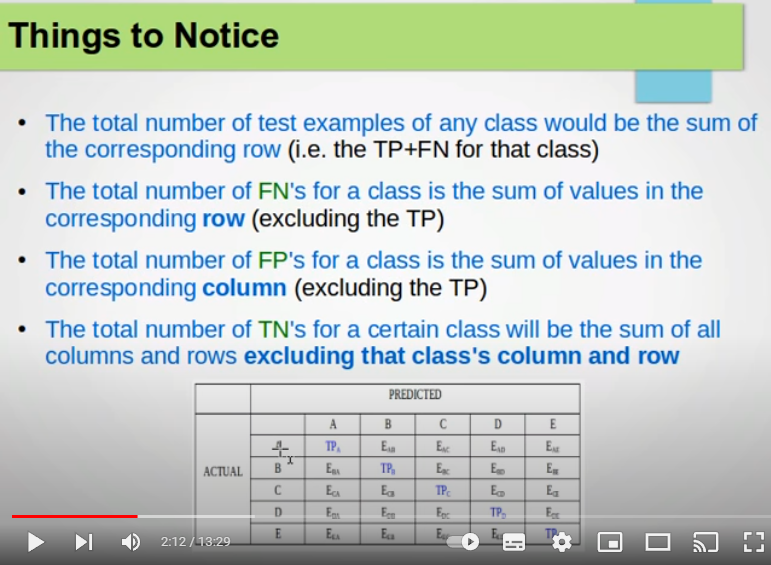

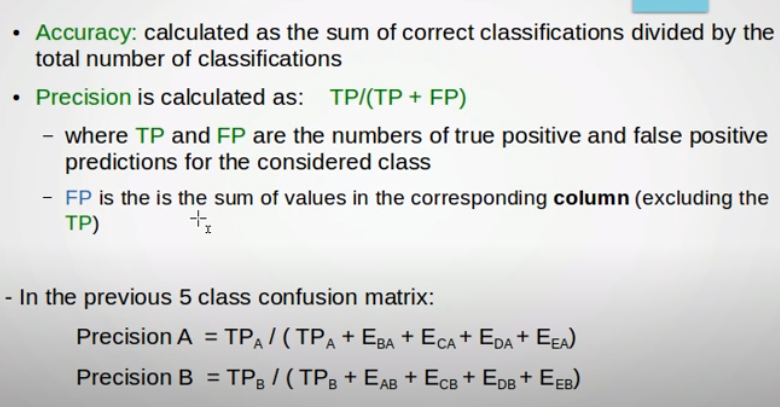

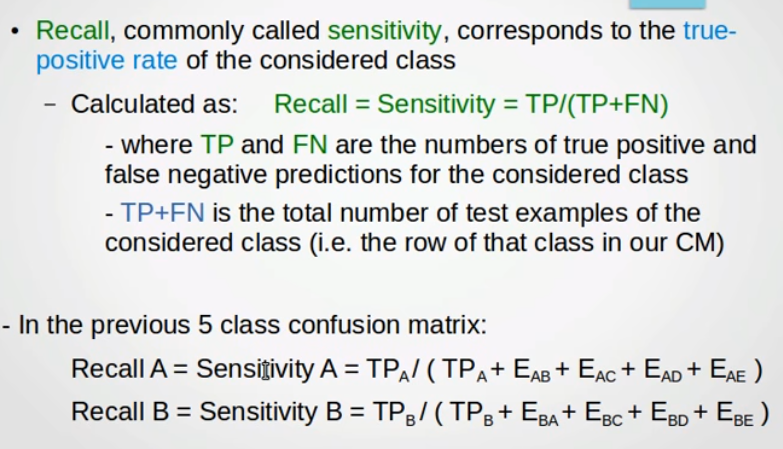

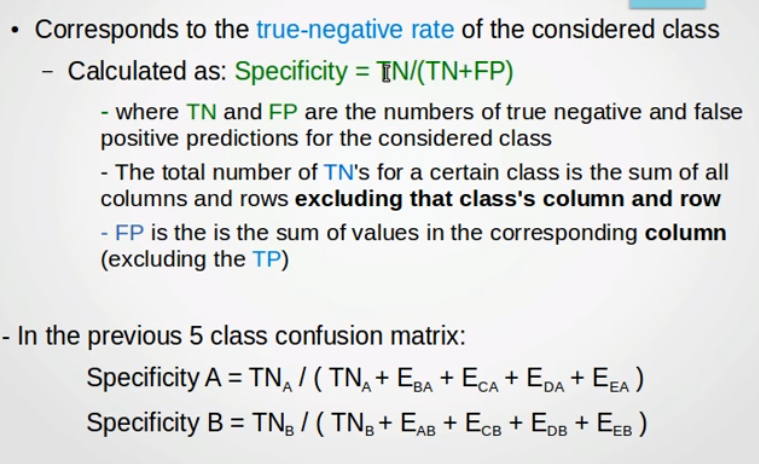

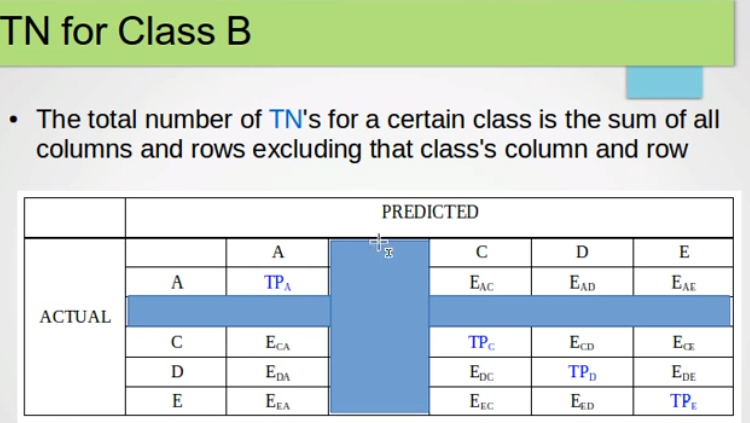

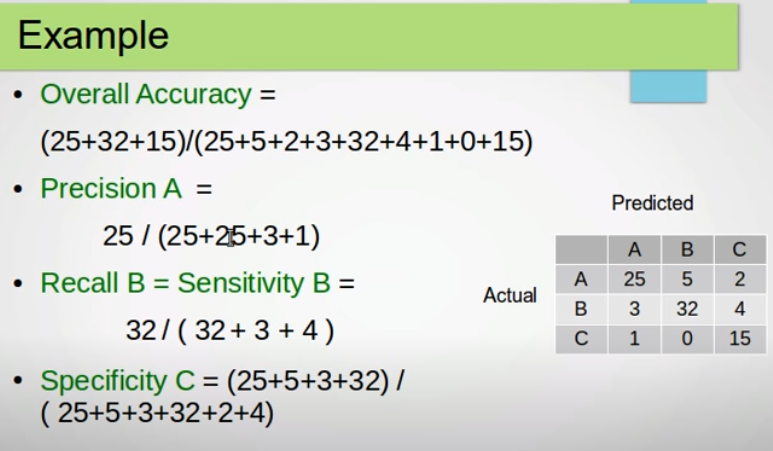

In [ ]:


logr_liblinear=LogisticRegression(verbose=1, solver="liblinear")
logr_liblinear.fit(x_train,y_train)

#task

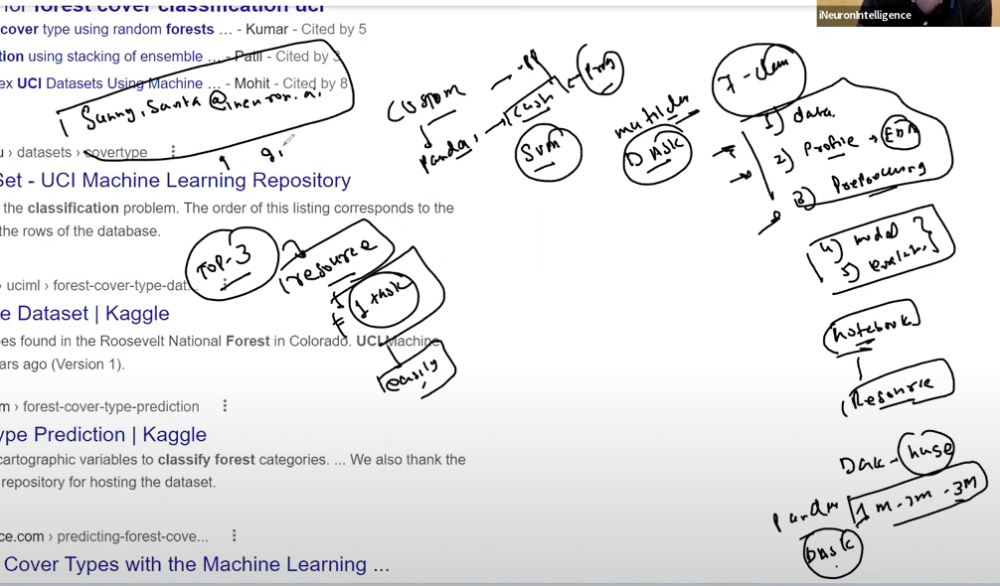
